## Import Needed Libraries

In [148]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier , AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adamax

from sklearn.metrics import accuracy_score, classification_report , confusion_matrix , ConfusionMatrixDisplay

from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings('ignore')
print('modules loaded')

modules loaded


## Read Data

In [149]:
df = pd.read_csv('/content/first inten project.csv',index_col='Booking_ID')
df.head()

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
Booking_ID,,,,,,,,,,,,,,,,
INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,10/2/2015,Not_Canceled
INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,11/6/2018,Not_Canceled
INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,2/28/2018,Canceled
INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,5/20/2017,Canceled
INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,4/11/2018,Canceled


In [150]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36285 entries, INN00001 to INN36286
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   number of adults          36285 non-null  int64  
 1   number of children        36285 non-null  int64  
 2   number of weekend nights  36285 non-null  int64  
 3   number of week nights     36285 non-null  int64  
 4   type of meal              36285 non-null  object 
 5   car parking space         36285 non-null  int64  
 6   room type                 36285 non-null  object 
 7   lead time                 36285 non-null  int64  
 8   market segment type       36285 non-null  object 
 9   repeated                  36285 non-null  int64  
 10  P-C                       36285 non-null  int64  
 11  P-not-C                   36285 non-null  int64  
 12  average price             36285 non-null  float64
 13  special requests          36285 non-null  int64  
 14  d

In [151]:
df.describe(include='all')

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
count,36285.000000,36285.000000,36285.000000,36285.000000,36285,36285.000000,36285,36285.000000,36285,36285.000000,36285.000000,36285.000000,36285.000000,36285.000000,36285,36285
unique,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,NaN,NaN,NaN,NaN,NaN,553,2
top,NaN,NaN,NaN,NaN,Meal Plan 1,NaN,Room_Type 1,NaN,Online,NaN,NaN,NaN,NaN,NaN,10/13/2018,Not_Canceled
freq,NaN,NaN,NaN,NaN,27842,NaN,28138,NaN,23221,NaN,NaN,NaN,NaN,NaN,254,24396
mean,1.844839,0.105360,0.810693,2.204602,NaN,0.030977,NaN,85.239851,NaN,0.025630,0.023343,0.153369,103.421636,0.619733,NaN,NaN
std,0.518813,0.402704,0.870590,1.410946,NaN,0.173258,NaN,85.938796,NaN,0.158032,0.368281,1.753931,35.086469,0.786262,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,2.000000,0.000000,0.000000,1.000000,NaN,0.000000,NaN,17.000000,NaN,0.000000,0.000000,0.000000,80.300000,0.000000,NaN,NaN
50%,2.000000,0.000000,1.000000,2.000000,NaN,0.000000,NaN,57.000000,NaN,0.000000,0.000000,0.000000,99.450000,0.000000,NaN,NaN
75%,2.000000,0.000000,2.000000,3.000000,NaN,0.000000,NaN,126.000000,NaN,0.000000,0.000000,0.000000,120.000000,1.000000,NaN,NaN


In [152]:
for i in df.columns:
    if i not in ['average price ','date of reservation','lead time']:
        fig=px.pie(df,names=i,title=f"count {i}")
        fig.update_traces(textposition='inside', textinfo='value+percent')
        fig.show()

In [153]:
count_adult_room=px.pie(df,names='room type',values='number of adults',title='room_type by number of adults')
count_adult_room.show()

In [154]:
count_adult_status=px.pie(df,names='booking status',values='number of adults',title='booking status by number of adults')
count_adult_status.update_traces(textposition='inside', textinfo='label+percent')
count_adult_status.show()

In [155]:
count_weekend_nights_room=px.pie(df,names='room type',values='number of weekend nights',title='room_type by number of weekend nights')
count_weekend_nights_room.show()

In [156]:
count_lead_time_room=px.pie(df,names='room type',values='lead time',title='room_type by lead time')
count_lead_time_room.show()

In [157]:
count_average_price_room=px.pie(df,names='room type',values='average price ',title='room_type by average price')
count_average_price_room.show()

In [158]:
fig = px.histogram(df, x="date of reservation",y='average price ',title='date of reservation by sum average price')
fig.show()

In [159]:
fig = px.histogram(df, x="booking status", color="car parking space", marginal="rug",
                   hover_data=df.columns)
fig.show()

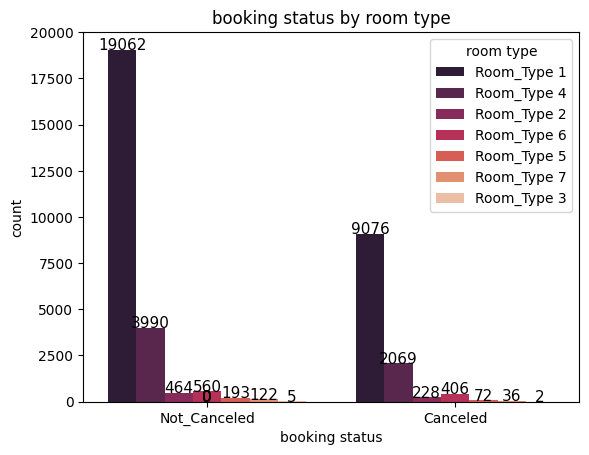

In [160]:
ax=sns.countplot(data=df, x="booking status", hue="room type", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by room type")
plt.show()

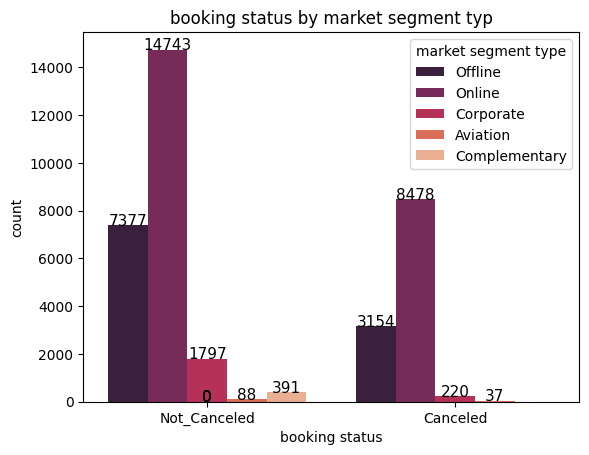

In [161]:
ax=sns.countplot(data=df, x="booking status", hue="market segment type", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by market segment typ")
plt.show()

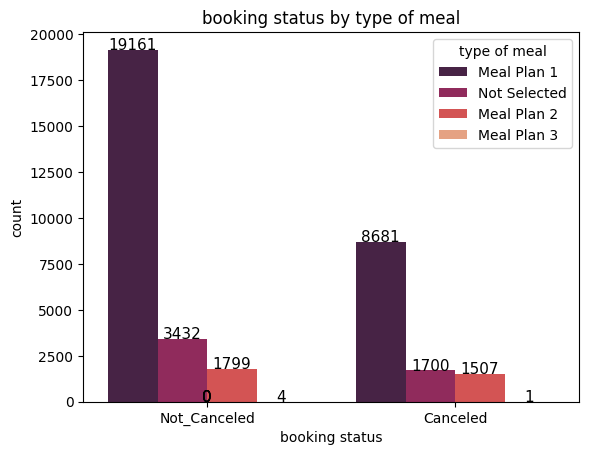

In [162]:
ax=sns.countplot(data=df, x="booking status", hue="type of meal", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by type of meal")
plt.show()

In [163]:
lead_time = px.histogram(df, x="lead time", title="Distribution of lead time")
lead_time.show()

In [164]:
average_price = px.histogram(df, x="average price ")
average_price.show()

In [165]:
date_status = px.histogram(df, x="date of reservation",color='booking status',title='count book status in date')
date_status.show()

In [166]:
date_market = px.histogram(df, x="date of reservation",color='market segment type',title='count market segment type in date')
date_market.show()

In [167]:
date_repeated = px.histogram(df, x="date of reservation",color='repeated',title='count repeated in date')
date_repeated.show()

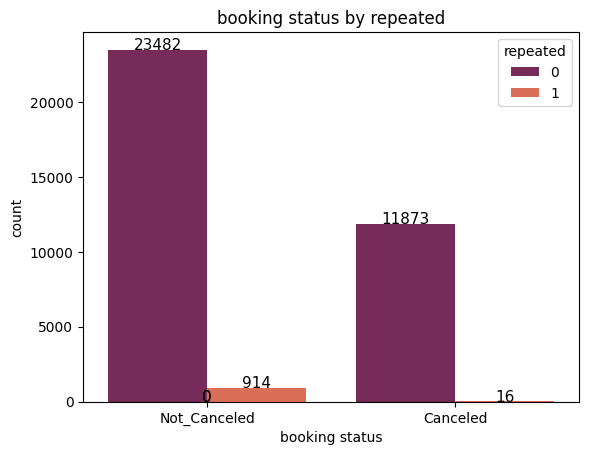

In [168]:
ax=sns.countplot(data=df, x="booking status", hue="repeated", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by repeated")
plt.show()

In [169]:
count_average_price_status=px.pie(df,names='booking status',values='average price ',title='booking status by average price')
count_average_price_status.show()

In [170]:
count_weekend_nights_status=px.pie(df,names='booking status',values='number of weekend nights',
                                   title='booking status by number of weekend nights')
count_weekend_nights_status.show()

In [171]:
count_p_c_repeated=px.pie(df,names='P-C',values='repeated',title='bookings that were canceled by repeat')
count_p_c_repeated.show()

In [172]:
p_c_repeated=px.histogram(df,x='P-C',color='repeated',title='bookings that were canceled by repeat')
p_c_repeated.show()

In [173]:
count_repeated_p_not_c=px.histogram(df,x='P-not-C',color='repeated',title='repeat by previous bookings not canceled')
count_repeated_p_not_c.show()

In [174]:
special_repeated = px.histogram(df, x="special requests",color='repeated',title='count special requests by repeated')
special_repeated.show()

In [175]:
count_status_special_requests=px.histogram(df,x='special requests',color='booking status',title='bookings status by special requests')
count_status_special_requests.show()

In [176]:
for i in df.columns:
    if i in ['average price ','lead time']:
      print(i)
      fig = px.box(df, y=i)
      fig.show()

lead time


average price 


## **preprocessing**

## check duplicates

In [177]:
df.duplicated().sum()

10276

In [178]:
df.drop_duplicates(inplace=True)

In [179]:
df.duplicated().sum()

0

In [180]:
df.isnull().sum()

,0
number of adults,0
number of children,0
number of weekend nights,0
number of week nights,0
type of meal,0
car parking space,0
room type,0
lead time,0
market segment type,0
repeated,0


In [181]:
df.dtypes

,0
number of adults,int64
number of children,int64
number of weekend nights,int64
number of week nights,int64
type of meal,object
car parking space,int64
room type,object
lead time,int64
market segment type,object
repeated,int64


## convert date of reservation to datetime

In [182]:
# convert the date of reservation from object to datetime
df['date of reservation'] = pd.to_datetime(df['date of reservation'], infer_datetime_format=True, errors='coerce')

In [183]:
# Extract from date of reservation information like year , day ,month
df['year'] = df['date of reservation'].dt.year
df['month'] = df['date of reservation'].dt.month
df['day'] = df['date of reservation'].dt.day

In [184]:
# remove the orginal column because I not needed
df = df.drop('date of reservation', axis=1)

In [185]:
df.head()

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,booking status,year,month,day
Booking_ID,,,,,,,,,,,,,,,,,,
INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,Not_Canceled,2015.0,10.0,2.0
INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,Not_Canceled,2018.0,11.0,6.0
INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,Canceled,2018.0,2.0,28.0
INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,Canceled,2017.0,5.0,20.0
INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,Canceled,2018.0,4.0,11.0


## check Null value

In [186]:
df.isnull().sum()

,0
number of adults,0
number of children,0
number of weekend nights,0
number of week nights,0
type of meal,0
car parking space,0
room type,0
lead time,0
market segment type,0
repeated,0


In [187]:
df.dropna(inplace=True)

In [188]:
df[['day', 'month', 'year']] = df[['day', 'month', 'year']].astype(int)

## label Encoder

In [189]:
lb=LabelEncoder()
df['booking status']=lb.fit_transform(df['booking status'])
df['market segment type']=lb.fit_transform(df['market segment type'])
df['room type']=lb.fit_transform(df['room type'])
df['type of meal']=lb.fit_transform(df['type of meal'])

In [190]:
df.dtypes

,0
number of adults,int64
number of children,int64
number of weekend nights,int64
number of week nights,int64
type of meal,int64
car parking space,int64
room type,int64
lead time,int64
market segment type,int64
repeated,int64


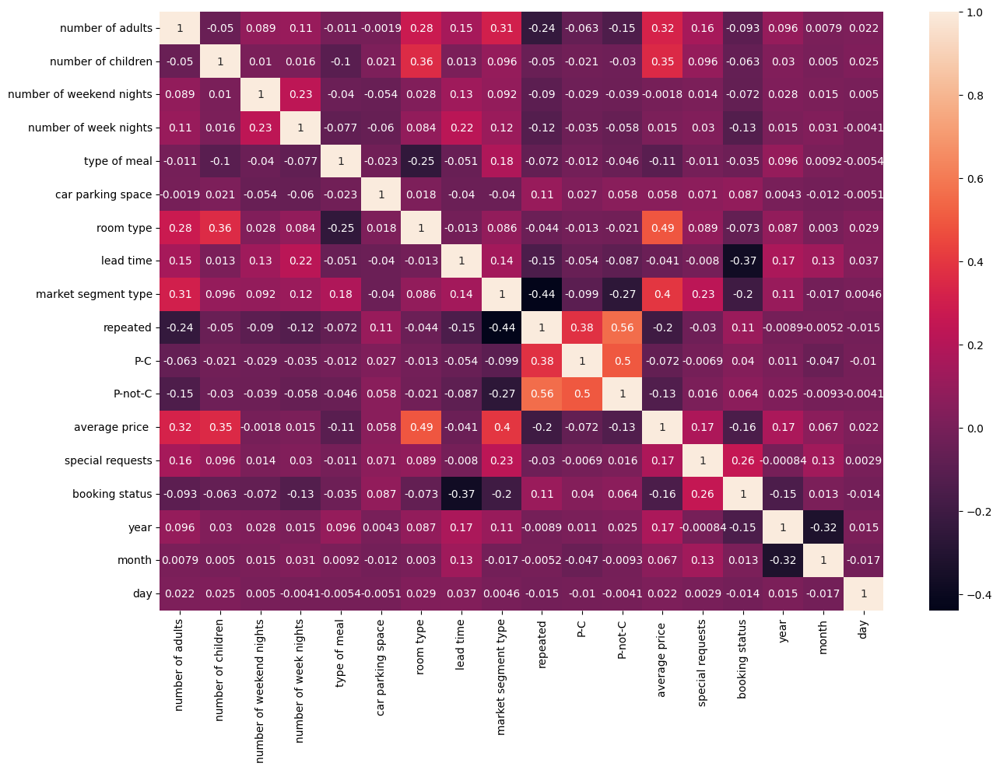

In [191]:
plt.figure(figsize=(15 ,10))
sns.heatmap(df.corr(), annot=True)
plt.show()

## **Remove outliers**

In [192]:
def remove_outliers_iqr(df):
    num_cols = df.select_dtypes(include=['float64', 'int64']).columns
    for col in num_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

    return df

In [193]:
df=remove_outliers_iqr(df)

In [194]:
df

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,booking status,year,month,day
Booking_ID,,,,,,,,,,,,,,,,,,
INN00026,2,0,0,2,0,0,0,99,4,0,0,0,114.30,1,1,2018,4,28
INN00032,2,0,2,2,0,0,0,107,4,0,0,0,87.50,1,1,2018,11,13
INN00040,2,0,2,1,0,0,3,186,4,0,0,0,121.80,1,0,2018,7,30
INN00041,2,0,0,4,0,0,0,64,4,0,0,0,93.60,2,1,2018,11,1
INN00042,2,0,0,2,0,0,0,35,4,0,0,0,102.00,1,1,2018,6,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
INN36265,2,0,0,2,0,0,3,187,4,0,0,0,105.30,0,0,2018,7,8
INN36266,2,0,1,3,0,0,0,15,4,0,0,0,100.73,0,1,2018,5,30
INN36267,2,0,2,2,0,0,1,8,4,0,0,0,85.96,1,0,2018,3,4


## define features and target

In [195]:
x=df.drop('booking status',axis=1)
y=df[['booking status']]

In [196]:
df['booking status'].value_counts()

,count
booking status,
1,4484
0,2547


## Correcting the imbalance discovered by using resample

In [197]:
oversample = SMOTE()


X_resampled, y_resampled = oversample.fit_resample(x, y)
x_sample=pd.DataFrame(X_resampled)
y_sample=pd.DataFrame(y_resampled)

datanew = pd.concat([x_sample,y_sample], axis=1)
df = datanew
print(f"The dataset now has {df.shape[0]} rows.")

The dataset now has 8968 rows.


In [198]:
df['booking status'].value_counts()

,count
booking status,
1,4484
0,4484


In [199]:
fig=px.pie(df,names='booking status',title=f"count booking status after sampling")
fig.update_traces(textposition='inside', textinfo='value+percent')
fig.show()

In [200]:
x=df.drop(columns=['booking status'])
y=df[['booking status']]

## feature selection

In [201]:
from re import X
k_best = SelectKBest(score_func=f_classif, k=8)
x_kbest = k_best.fit_transform(x, y)

In [202]:
x_kbest

array([[  0.        ,   2.        ,   0.        , ..., 114.3       ,
          1.        ,   4.        ],
       [  2.        ,   2.        ,   0.        , ...,  87.5       ,
          1.        ,  11.        ],
       [  2.        ,   1.        ,   0.        , ..., 121.8       ,
          1.        ,   7.        ],
       ...,
       [  0.        ,   3.        ,   0.        , ..., 134.2792613 ,
          0.        ,   6.        ],
       [  0.        ,   4.        ,   0.        , ..., 119.45049343,
          0.        ,   7.        ],
       [  1.        ,   4.        ,   0.        , ...,  97.26631043,
          0.        ,   3.        ]])

## data scaling

In [203]:
scaler=MinMaxScaler()
x=scaler.fit_transform(x_kbest)

## split data

In [204]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42,stratify=y)

## **Models**

### **1-logistic Regression**

In [397]:
lr=LogisticRegression(C=0.1)
lr.fit(X_train,y_train)

LogisticRegression(C=0.1)

In [398]:
lr.score(X_train,y_train)

0.7835238360747142

In [399]:
y_pred=lr.predict(X_test)

In [400]:
print(accuracy_score(y_test,y_pred))

0.7948717948717948


[[717 180]
 [188 709]]


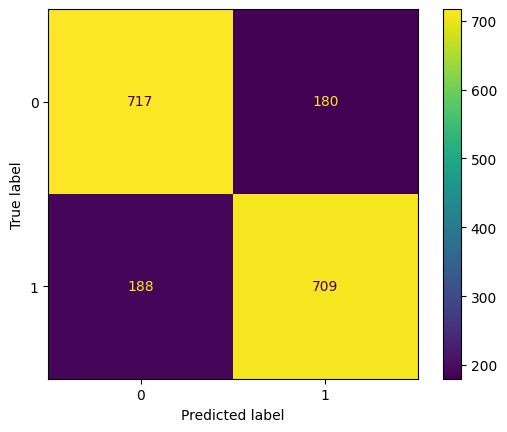

In [401]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
print(confusion_matrix(y_test, y_pred))

In [402]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.80      0.80       897
           1       0.80      0.79      0.79       897

    accuracy                           0.79      1794
   macro avg       0.79      0.79      0.79      1794
weighted avg       0.79      0.79      0.79      1794



### **2-Support Vector Machine**

In [391]:
svm=SVC(C=1)
svm.fit(X_train,y_train)

SVC(C=1)

In [392]:
svm.score(X_train,y_train)

0.8065235572902146

In [393]:
y_pre_svm=svm.predict(X_test)

In [394]:
print(accuracy_score(y_test,y_pre_svm))

0.810479375696767


[[736 161]
 [179 718]]


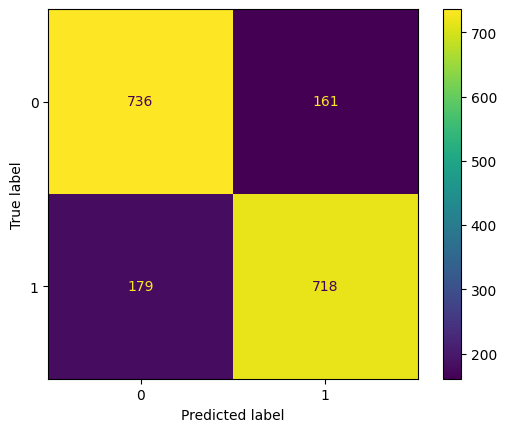

In [395]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pre_svm)
print(confusion_matrix(y_test, y_pre_svm))

In [396]:
print(classification_report(y_test, y_pre_svm))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81       897
           1       0.82      0.80      0.81       897

    accuracy                           0.81      1794
   macro avg       0.81      0.81      0.81      1794
weighted avg       0.81      0.81      0.81      1794



### **3-KNeighborsClassifier**

In [378]:
knn=KNeighborsClassifier(n_neighbors=11)
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=11)

In [379]:
knn.score(X_train,y_train)

0.8211597435182604

In [380]:
y_pred_knn=knn.predict(X_test)

In [381]:
print(accuracy_score(y_test,y_pred_knn))

0.8127090301003345


[[738 159]
 [177 720]]


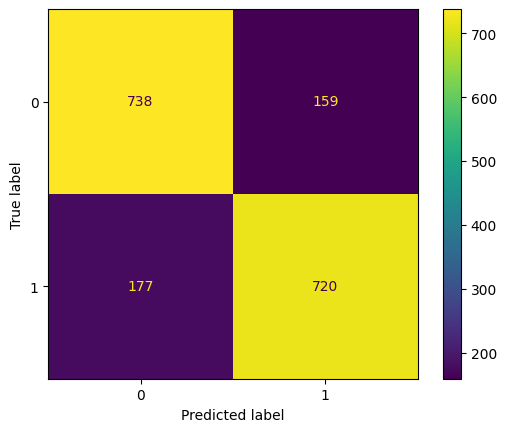

In [382]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_knn)
print(confusion_matrix(y_test, y_pred_knn))

In [383]:
print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.81      0.82      0.81       897
           1       0.82      0.80      0.81       897

    accuracy                           0.81      1794
   macro avg       0.81      0.81      0.81      1794
weighted avg       0.81      0.81      0.81      1794



### 4-Decision Tree

In [223]:
dt=DecisionTreeClassifier(criterion='entropy',max_depth=5)
dt.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [224]:
dt.score(X_train,y_train)

0.8231112350153331

In [225]:
y_pred_dt=dt.predict(X_test)

In [226]:
print(accuracy_score(y_test,y_pred_dt))

0.8249721293199554


[[716 181]
 [133 764]]


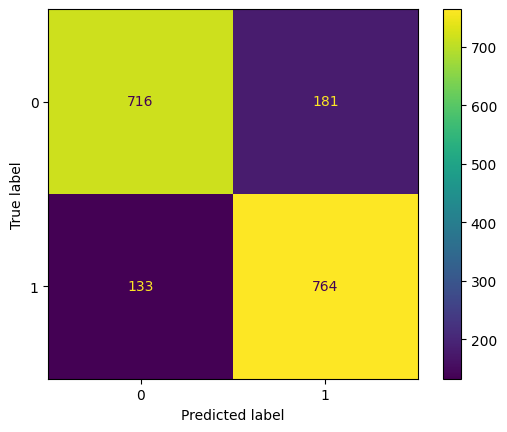

In [227]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_dt)
print(confusion_matrix(y_test, y_pred_dt))

In [228]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.84      0.80      0.82       897
           1       0.81      0.85      0.83       897

    accuracy                           0.82      1794
   macro avg       0.83      0.82      0.82      1794
weighted avg       0.83      0.82      0.82      1794



### 5-Randomforest

In [372]:
rf=RandomForestClassifier(max_depth= 10, n_estimators= 200)
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=10, n_estimators=200)

In [373]:
rf.score(X_train,y_train)

0.8614441037078339

In [374]:
y_pred_rf=rf.predict(X_test)

In [375]:
print(accuracy_score(y_test,y_pred_rf))

0.8405797101449275


[[727 170]
 [116 781]]


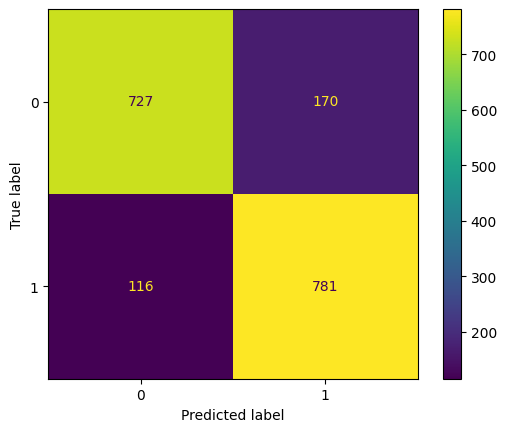

In [376]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rf)
print(confusion_matrix(y_test, y_pred_rf))

In [377]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.86      0.81      0.84       897
           1       0.82      0.87      0.85       897

    accuracy                           0.84      1794
   macro avg       0.84      0.84      0.84      1794
weighted avg       0.84      0.84      0.84      1794



## 6-AdaBoostClassifier

In [235]:
ad=AdaBoostClassifier()
ad.fit(X_train,y_train)

AdaBoostClassifier()

In [236]:
ad.score(X_train,y_train)

0.8130749930303875

In [237]:
y_pred_ad=ad.predict(X_test)

In [238]:
print(accuracy_score(y_test,y_pred_ad))

0.8082497212931996


[[713 184]
 [160 737]]


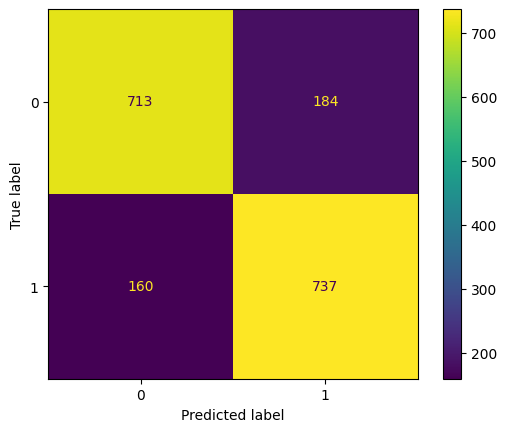

In [239]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_ad)
print(confusion_matrix(y_test, y_pred_ad))

In [240]:
print(classification_report(y_test, y_pred_ad))

              precision    recall  f1-score   support

           0       0.82      0.79      0.81       897
           1       0.80      0.82      0.81       897

    accuracy                           0.81      1794
   macro avg       0.81      0.81      0.81      1794
weighted avg       0.81      0.81      0.81      1794



## models using selectfbest by gridsearch

In [241]:
models = {
    'svm': (SVC(gamma='auto'), {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}),
    'logistic': (LogisticRegression(max_iter=100), {'C': [0.1, 1, 10],'penalty':['l1','l2']}),
    'random_forest': (RandomForestClassifier(), {'n_estimators': [20,50, 100, 200],'max_depth': np.arange(0,30,5)}),
    'decision_tree': (DecisionTreeClassifier(), {'max_depth': np.arange(0,30,5),"criterion": ["gini", "entropy"]}),
    'knn': (KNeighborsClassifier(), {'n_neighbors': np.arange(1, 10)}),
    'adaboost': (AdaBoostClassifier(), {'n_estimators': [20,50,100,200,300]})

}
for name, (model, param_grid) in models.items():
    grid_search = GridSearchCV(model, param_grid, cv=5)
    grid_search.fit(X_train, y_train)
    print(f"Best Parameters for {name}: {grid_search.best_params_}")
    print(f"Best Score for {name}: {grid_search.best_score_}")
    y_pred = grid_search.predict(X_test)
    print(f"Accuracy for {name}: {accuracy_score(y_test, y_pred)}")
    print("\n")
    print(f"Confusion Matrix for {name}: \n{confusion_matrix(y_test, y_pred)}")
    print("\n")
    print(f"Classification Report for {name}: \n{classification_report(y_test, y_pred)}")
    print("---------------------------------------------------------\n")

Best Parameters for svm: {'C': 10, 'kernel': 'rbf'}
Best Score for svm: 0.7840803969306878
Accuracy for svm: 0.7954292084726867


Confusion Matrix for svm: 
[[741 156]
 [211 686]]


Classification Report for svm: 
              precision    recall  f1-score   support

           0       0.78      0.83      0.80       897
           1       0.81      0.76      0.79       897

    accuracy                           0.80      1794
   macro avg       0.80      0.80      0.80      1794
weighted avg       0.80      0.80      0.80      1794

---------------------------------------------------------

Best Parameters for logistic: {'C': 0.1, 'penalty': 'l2'}
Best Score for logistic: 0.7821293718017873
Accuracy for logistic: 0.7948717948717948


Confusion Matrix for logistic: 
[[717 180]
 [188 709]]


Classification Report for logistic: 
              precision    recall  f1-score   support

           0       0.79      0.80      0.80       897
           1       0.80      0.79      0.79       8

## Try the PCA in models

In [242]:
pca=PCA(0.95)
X_pca=pca.fit_transform(x)

In [243]:
X_pca.shape

(8968, 7)

In [244]:
pca.n_components_

7

In [245]:
X_train_pc,X_test_pc,y_train_pc,y_test_pc=train_test_split(X_pca,y,test_size=0.2,random_state=42,stratify=y)

## logistic use pca

In [246]:
lr_pc=LogisticRegression()
lr_pc.fit(X_train_pc,y_train_pc)

LogisticRegression()

In [247]:
lr_pc.score(X_train_pc,y_train_pc)

0.7755784778366323

In [248]:
y_pred_lr=lr_pc.predict(X_test_pc)

In [249]:
print(accuracy_score(y_test_pc,y_pred_lr))

0.7881828316610925


[[717 180]
 [200 697]]


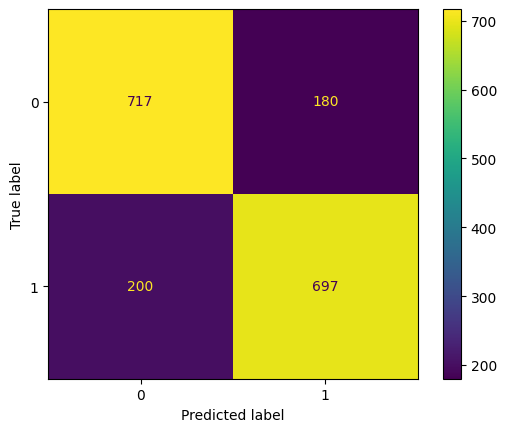

In [250]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_lr)
print(confusion_matrix(y_test_pc, y_pred_lr))

In [251]:
print(classification_report(y_test_pc, y_pred_lr))

              precision    recall  f1-score   support

           0       0.78      0.80      0.79       897
           1       0.79      0.78      0.79       897

    accuracy                           0.79      1794
   macro avg       0.79      0.79      0.79      1794
weighted avg       0.79      0.79      0.79      1794



## svm using pca

In [252]:
svm=SVC()
svm.fit(X_train_pc,y_train_pc)

SVC()

In [253]:
svm.score(X_train_pc,y_train_pc)

0.8093114022860329

In [254]:
y_pred_psv=svm.predict(X_test_pc)

In [255]:
print(accuracy_score(y_test_pc, y_pred_psv))

0.8121516164994426


[[735 162]
 [175 722]]


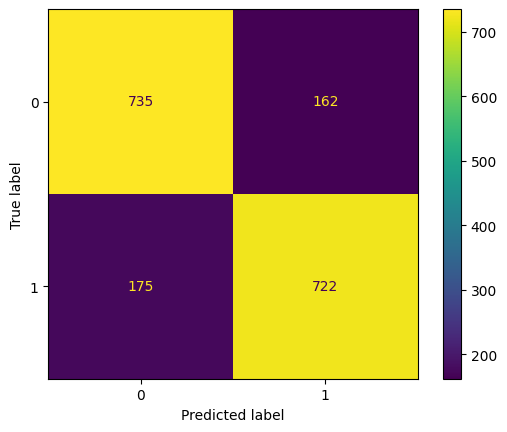

In [256]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_psv)
print(confusion_matrix(y_test_pc, y_pred_psv))

In [257]:
print(classification_report(y_test_pc, y_pred_psv))

              precision    recall  f1-score   support

           0       0.81      0.82      0.81       897
           1       0.82      0.80      0.81       897

    accuracy                           0.81      1794
   macro avg       0.81      0.81      0.81      1794
weighted avg       0.81      0.81      0.81      1794



## KNN using PCA

In [258]:
knn_pc=KNeighborsClassifier(n_neighbors=9)
knn_pc.fit(X_train_pc,y_train_pc)

KNeighborsClassifier(n_neighbors=9)

In [259]:
knn_pc.score(X_train_pc,y_train_pc)

0.823390019514915

In [260]:
y_pred_kpc=knn_pc.predict(X_test_pc)

In [261]:
print(accuracy_score(y_test_pc,y_pred_kpc))

0.8010033444816054


[[724 173]
 [184 713]]


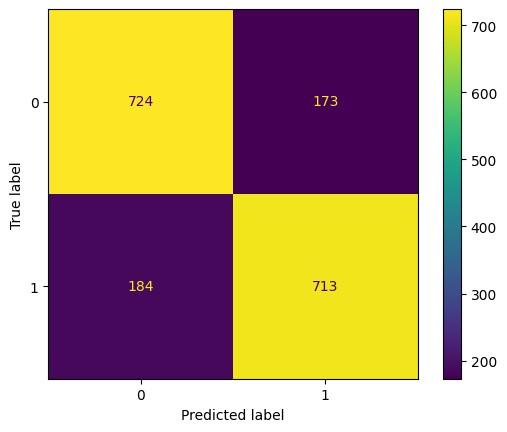

In [262]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_kpc)
print(confusion_matrix(y_test_pc, y_pred_kpc))

In [263]:
print(classification_report(y_test_pc, y_pred_kpc))

              precision    recall  f1-score   support

           0       0.80      0.81      0.80       897
           1       0.80      0.79      0.80       897

    accuracy                           0.80      1794
   macro avg       0.80      0.80      0.80      1794
weighted avg       0.80      0.80      0.80      1794



## DecisionTree using PCA

In [366]:
dt_pc=DecisionTreeClassifier(criterion= 'entropy',max_depth=7)
dt_pc.fit(X_train_pc,y_train_pc)

DecisionTreeClassifier(criterion='entropy', max_depth=7)

In [367]:
dt_pc.score(X_train_pc,y_train_pc)

0.8197658210203512

In [368]:
y_pred_dtp=dt_pc.predict(X_test_pc)

In [369]:
print(accuracy_score(y_test_pc,y_pred_dtp))

0.7842809364548495


[[728 169]
 [218 679]]


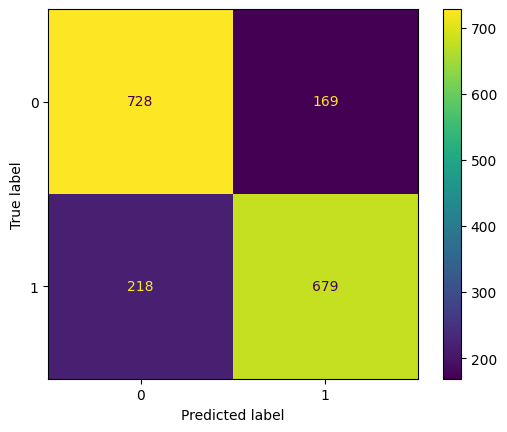

In [370]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_dtp)
print(confusion_matrix(y_test_pc, y_pred_dtp))

In [371]:
print(classification_report(y_test_pc, y_pred_dtp))

              precision    recall  f1-score   support

           0       0.77      0.81      0.79       897
           1       0.80      0.76      0.78       897

    accuracy                           0.78      1794
   macro avg       0.79      0.78      0.78      1794
weighted avg       0.79      0.78      0.78      1794



## Randomforest using PCA

In [317]:
rf_pc=RandomForestClassifier(n_estimators=250,max_depth=9)
rf_pc.fit(X_train_pc,y_train_pc)

RandomForestClassifier(max_depth=9, n_estimators=250)

In [318]:
rf_pc.score(X_train_pc,y_train_pc)

0.8561471982157792

In [319]:
y_pred_rpc=rf_pc.predict(X_test_pc)

In [320]:
print(accuracy_score(y_test_pc,y_pred_rpc))

0.8255295429208472


[[731 166]
 [147 750]]


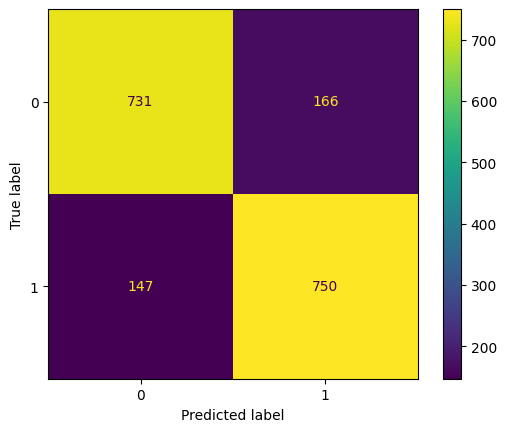

In [321]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_rpc)
print(confusion_matrix(y_test_pc, y_pred_rpc))

In [322]:
print(classification_report(y_test_pc, y_pred_rpc))

              precision    recall  f1-score   support

           0       0.83      0.81      0.82       897
           1       0.82      0.84      0.83       897

    accuracy                           0.83      1794
   macro avg       0.83      0.83      0.83      1794
weighted avg       0.83      0.83      0.83      1794



## AdaBoostClassifier using PCA

In [294]:
ad_pc=AdaBoostClassifier(n_estimators=200)
ad_pc.fit(X_train_pc,y_train_pc)

AdaBoostClassifier(n_estimators=200)

In [295]:
ad_pc.score(X_train_pc,y_train_pc)

0.8088932255366602

In [296]:
y_pred_adpc=ad_pc.predict(X_test_pc)

In [297]:
print(accuracy_score(y_test_pc,y_pred_adpc))

0.7959866220735786


[[715 182]
 [184 713]]


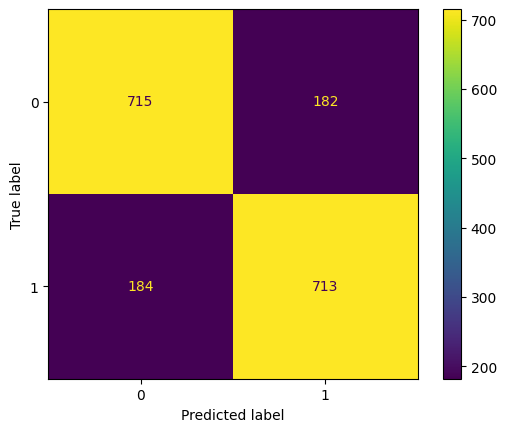

In [298]:
ConfusionMatrixDisplay.from_predictions(y_test_pc, y_pred_adpc)
print(confusion_matrix(y_test_pc, y_pred_adpc))

In [299]:
print(classification_report(y_test_pc, y_pred_adpc))

              precision    recall  f1-score   support

           0       0.80      0.80      0.80       897
           1       0.80      0.79      0.80       897

    accuracy                           0.80      1794
   macro avg       0.80      0.80      0.80      1794
weighted avg       0.80      0.80      0.80      1794



## models using PCA by gridsearch

In [282]:
models_pca = {
    'svm': (SVC(gamma='auto'), {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}),
    'logistic': (LogisticRegression(max_iter=100), {'C': [0.1, 1, 10],'penalty':['l1','l2']}),
    'random_forest': (RandomForestClassifier(), {'n_estimators': [20,50, 100, 200],'max_depth': np.arange(0,30,5)}),
    'decision_tree': (DecisionTreeClassifier(), {'max_depth': np.arange(0,30,5),"criterion": ["gini", "entropy"]}),
    'knn': (KNeighborsClassifier(), {'n_neighbors': np.arange(1, 10)}),
    'adaboost': (AdaBoostClassifier(), {'n_estimators': [20,50,100,200,300]})

}
for name, (model, param_grid) in models_pca.items():
    grid_search_pc = GridSearchCV(model, param_grid, cv=5)
    grid_search_pc.fit(X_train_pc,y_train_pc)
    print(f"Best Parameters for {name}: {grid_search_pc.best_params_}")
    print(f"Best Score for {name}: {grid_search_pc.best_score_}")
    y_pred_pc = grid_search_pc.predict(X_test_pc)
    print(f"Accuracy for {name}: {accuracy_score(y_test_pc, y_pred_pc)}")
    print("\n")
    print(f"Confusion Matrix for {name}: \n{confusion_matrix(y_test_pc, y_pred_pc)}")
    print("\n")
    print(f"Classification Report for {name}: \n{classification_report(y_test_pc, y_pred_pc)}")
    print("---------------------------------------------------------\n")

Best Parameters for svm: {'C': 10, 'kernel': 'rbf'}
Best Score for svm: 0.7812930376763421
Accuracy for svm: 0.79041248606466


Confusion Matrix for svm: 
[[733 164]
 [212 685]]


Classification Report for svm: 
              precision    recall  f1-score   support

           0       0.78      0.82      0.80       897
           1       0.81      0.76      0.78       897

    accuracy                           0.79      1794
   macro avg       0.79      0.79      0.79      1794
weighted avg       0.79      0.79      0.79      1794

---------------------------------------------------------

Best Parameters for logistic: {'C': 0.1, 'penalty': 'l2'}
Best Score for logistic: 0.7779476039829136
Accuracy for logistic: 0.7859531772575251


Confusion Matrix for logistic: 
[[717 180]
 [204 693]]


Classification Report for logistic: 
              precision    recall  f1-score   support

           0       0.78      0.80      0.79       897
           1       0.79      0.77      0.78       897

## ANN model

In [283]:
model=Sequential()
model.add(Dense(64,activation='relu',input_dim=X_train.shape[1]))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(32,activation='relu'))
model.add(Dense(16,activation='relu'))
model.add(Dense(8,activation='relu'))
model.add(Dense(1,activation='sigmoid'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                      │ (None, 64)                  │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 32)                  │           4,128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 16)                  │             528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 8)                   │             136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 13,697 (53.50 KB)

 Trainable params: 13,697 (53.50 KB)

 Non-trainable params: 0 (0.00 B)

In [284]:
model.compile(optimizer='Adamax', loss='binary_crossentropy', metrics=['accuracy'])

In [285]:
callback=EarlyStopping(monitor='val_loss',patience=10,restore_best_weights=True)
history=model.fit(X_train,y_train,epochs=200,validation_split=0.2,callbacks=callback)

Epoch 1/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6594 - loss: 0.6451 - val_accuracy: 0.7763 - val_loss: 0.5262
Epoch 2/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7686 - loss: 0.5251 - val_accuracy: 0.7875 - val_loss: 0.4895
Epoch 3/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7916 - loss: 0.4815 - val_accuracy: 0.7840 - val_loss: 0.4893
Epoch 4/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7834 - loss: 0.4847 - val_accuracy: 0.7875 - val_loss: 0.4827
Epoch 5/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7890 - loss: 0.4767 - val_accuracy: 0.7798 - val_loss: 0.4797
Epoch 6/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7905 - loss: 0.4701 - val_accuracy: 0.7847 - val_loss: 0.4784
Epoch 7/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7833 - loss: 0.4754 - val_accuracy: 0.7819 - val_loss: 0.4768
Epoch 8/200
180/180 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7938 - loss: 0.4648 - val_acc

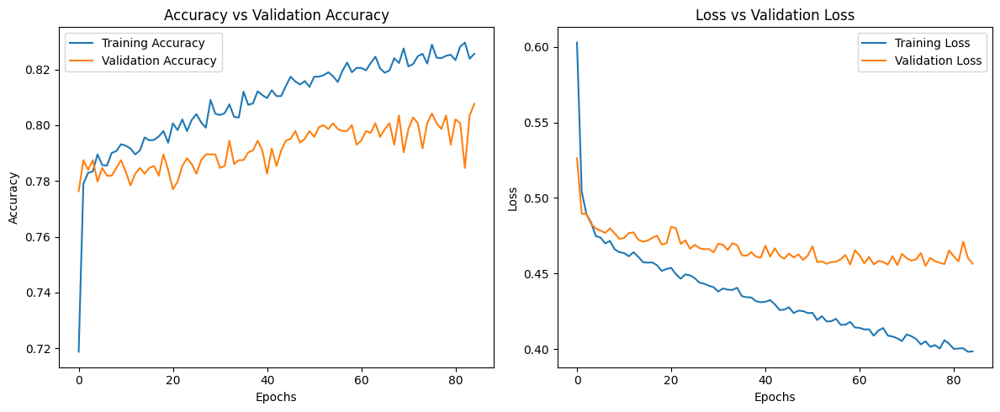

In [286]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [287]:
loss, accuracy = model.evaluate(X_test, y_test)

57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8373 - loss: 0.3976


In [288]:
print(f'Test Accuracy: {accuracy * 100:.2f}%')
print(f'Test Loss: {loss*100:.2f}')

Test Accuracy: 83.11%
Test Loss: 40.95


In [289]:
y_pred=model.predict(X_test)

57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


In [290]:
y_pred = (y_pred >= 0.5).astype(int)

In [291]:
print(accuracy_score(y_test,y_pred))

0.8311036789297659


[[737 160]
 [143 754]]


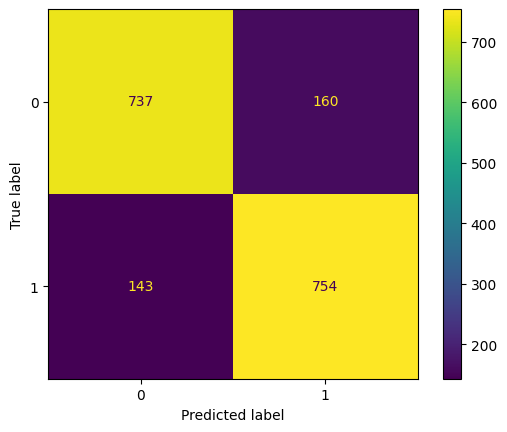

In [292]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred)
print(confusion_matrix(y_test, y_pred))

In [293]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83       897
           1       0.82      0.84      0.83       897

    accuracy                           0.83      1794
   macro avg       0.83      0.83      0.83      1794
weighted avg       0.83      0.83      0.83      1794

